## FCN - Simulate the `Detection Layer` Process 

We generate the inputs to `DetectTargetLayer` , to manipulate and modify the layer to procduce a modified `output_rois` 
containing false positives. 
This will be passed on the the heatmap layer, and through there will become the input to FCN.

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
%matplotlib inline
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../')
from mrcnn.prep_notebook import (build_inference_pipeline, build_trainfcn_pipeline, prep_coco_dataset, 
                                run_training_pipeline, run_inference_pipeline)
from mrcnn.prep_notebook import get_training_batch, display_training_batch
from mrcnn.prep_notebook import get_inference_batch, get_image_batch
import numpy as np
import mrcnn.visualize as visualize
import mrcnn.utils     as utils
# from mrcnn.visualize import (plot_3d_heatmap, plot_2d_heatmap, plot_2d_heatmap_compare, plot_3d_heatmap_compare,
#                             display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn, display_heatmaps_mrcnn_fcn)
                             
# import matplotlib as plt
%matplotlib inline
WEIGHT_FILE = 'F:/models/train_fcn8_coco_adam/fcn20181109T0000/fcn_0900.h5'
mrcnn_model, fcn_model = build_inference_pipeline(fcn_weight_file = WEIGHT_FILE, batch_size = 2)
# mrcnn_model, fcn_model = build_trainfcn_pipeline(fcn_weight_file = WEIGHT_FILE, batch_size = 2)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

--> Execution started at: 11-18-2018 @ 18:40:42
    Tensorflow Version: 1.8.0   Keras Version : 2.2.0 
--batch_size 2 --mrcnn_logs_dir train_mrcnn_coco --fcn_logs_dir   train_fcn8_coco_adam --mrcnn_model    last --fcn_model      last --fcn_arch       fcn8 --fcn_layers     all --sysout        screen 
    MRCNN Model        :  last
    FCN Model          :  last
    MRCNN Log Dir      :  train_mrcnn_coco
    FCN Log Dir        :  train_fcn8_coco_adam
    FCN Arch           :  FCN8
    FCN Log Dir        :  ['all']
    sysout             :  SCREEN
>>> Initialize Paths
 windows  Windows

Paths:
-------------------------
COCO_DATASET_PATH              F:\MLDatasets\coco2014
COCO_HEATMAP_PATH              F:\MLDatasets\coco2014_heatmaps
COCO_MODEL_PATH                F:\PretrainedModels\mask_rcnn_coco.h5
DIR_DATASET                    F:\MLDatasets
DIR_PRETRAINED                 F:\PretrainedModels
DIR_R

   FCN Block 33 shape is               :  (None, 64, 64, 256)
   FCN Block 34 (Max pooling) shape is :  (?, 32, 32, 256)
   FCN Block 41 shape is               :  (None, 32, 32, 512)
   FCN Block 42 shape is               :  (None, 32, 32, 512)
   FCN Block 43 shape is               :  (None, 32, 32, 512)
   FCN Block 44 (Max pooling) shape is :  (?, 16, 16, 512)
   FCN Block 51 shape is               :  (None, 16, 16, 512)
   FCN Block 52 shape is               :  (None, 16, 16, 512)
   FCN Block 53 shape is               :  (None, 16, 16, 512)
   FCN Block 54 (Max pooling) shape is :  (None, 8, 8, 512)

   --- FCN32 ----------------------------
   FCN fully connected 1 (fc1) shape   :  (None, 8, 8, 4096)
   FCN fully connected 2 (fc2) shape   :  (None, 8, 8, 4096)
   FCN conv2d (fcn32_deconv2D) shape   :  (?, 8, 8, 81)  keras_tensor  True

   --- FCN16 ----------------------------
   FCN scorePool4 (Conv2D(Pool4)) shape is                   :  (None, 16, 16, 81)    keras_tensor  True

### Load dataset

In [4]:
dataset_test, test_generator = prep_coco_dataset(['train','val35k'], mrcnn_model.config, generator = True)
coco_class_names = dataset_test.class_names
####  Display number of loaded images and class names
print("Testing Dataset Image Count: {}".format(len(dataset_test.image_ids)))
print("Testing Dataset Class Count: {}".format(dataset_test.num_classes))

Kevin loading annotations file F:\MLDatasets\coco2014\annotations/instances_train2014.json  into memory...
Done (t=16.45s)
creating index...
index created!
 image dir            :  F:\MLDatasets\coco2014\train2014
 json_path_dir        :  F:\MLDatasets\coco2014\annotations/instances_train2014.json
 number of images     :  82081
 image_ids[:10]       :  [262145, 262146, 524291, 131074, 393221, 131075, 393223, 393224, 524297, 9]
 image_ids[1000:1010] :  [1451, 132523, 1453, 132527, 263599, 132529, 132528, 263603, 263604, 132533]
Kevin loading annotations file F:\MLDatasets\coco2014\annotations/instances_valminusminival2014.json  into memory...
Done (t=8.37s)
creating index...
index created!
 image dir            :  F:\MLDatasets\coco2014\val2014
 json_path_dir        :  F:\MLDatasets\coco2014\annotations/instances_valminusminival2014.json
 number of images     :  35185
 image_ids[:10]       :  [262148, 393225, 131089, 262161, 262162, 393243, 262175, 131108, 393254, 42]
 image_ids[1000:10

## Display Images

### Get next image from generator and display 

 Image_id    :  103187  Reference:  http://cocodataset.org/#explore?id=465566 Coco Id: 465566
 Image meta [103187    640    480      3      0    128   1024    896      1      1]
 Class ids   :  (6,)    [ 1  1  1  7  7 68]
 Class Names :  ['person', 'person', 'person', 'train', 'train', 'cell phone']


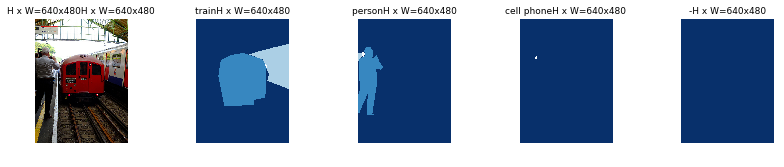

 display_instances() : Image shape:  (640, 480, 3)
 Image_id    :  23576  Reference:  http://cocodataset.org/#explore?id=295875 Coco Id: 295875
 Image meta [23576   640   427     3     0   170  1024   853     1     1]
 Class ids   :  (2,)    [ 1 70]
 Class Names :  ['person', 'oven']


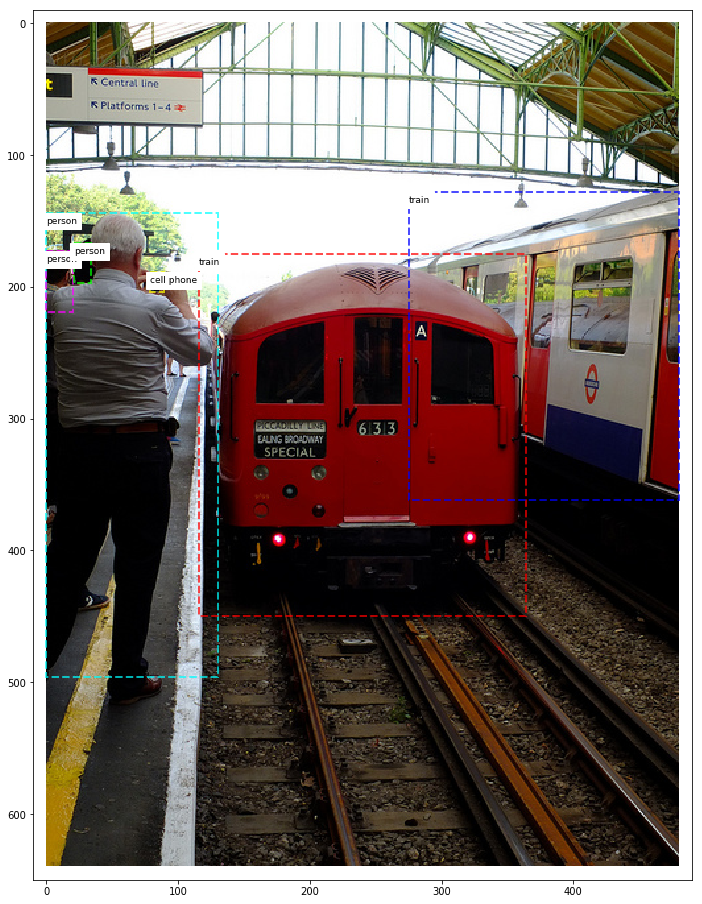

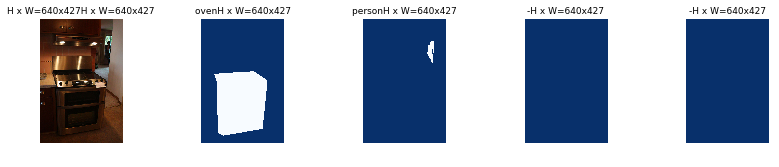

 display_instances() : Image shape:  (640, 427, 3)


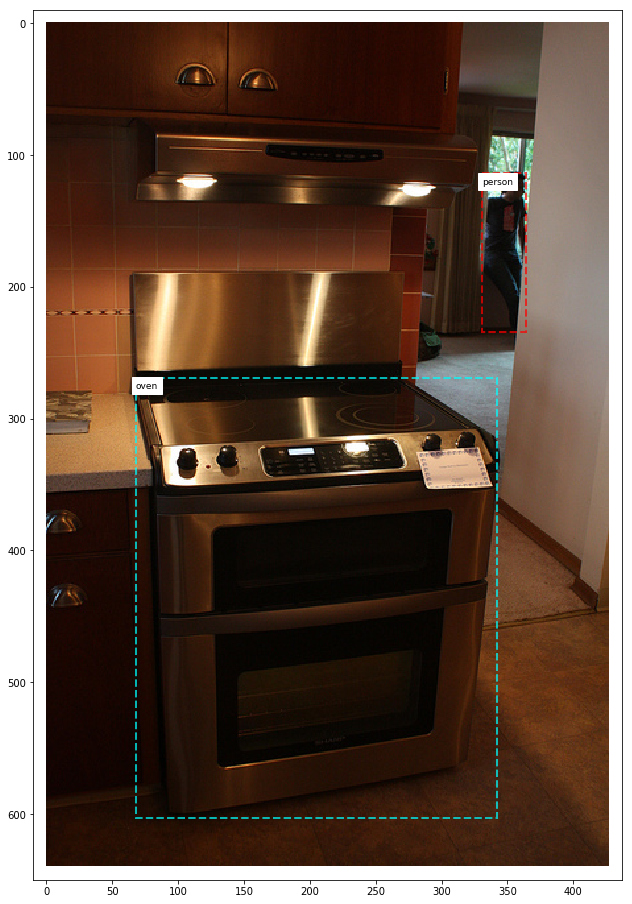

In [5]:
test_batch_x, test_batch_y = next(test_generator)
display_training_batch(dataset_test, test_batch_x)

### Get images using a list of image ids

In [ ]:
## 62642 (persons),   68539 (trucks) 36466 (surfers)  75040 (boat and persons)
## 36466 surfers. 5498 basketbal players, 27711,30531
## 5498 lots of motorcylces & persons - 
## Persons: #26026, #7719, 111864, 58240,  
## 35347 - laptops, keyboards and cat
## items = [59199 , 102868]
## 89243: Person, bicylce and traiffic lights
## 101623 (cake and forks), 41423 (elephant & people)
## 33477 Table, bowl, cup, sandwich, knife
## 26763 Table, chair, cup , bowl, bottle
## 49316 Table, book, backpack, many bottles
## 12902 Car , truck and traffic light tree
## 57327 person and horses
## 26026 -- mountain, skiers, skiboards 
##  7719 -- people, bottles, handbags
## 27711 -- persons and boats
## 18045 -- person     
## 36769 -- people in meeting room with a 'giraffe'detection?
##  8634 -- person
## 30531 -- tennis players 
##  8645 -- two people
## 24627 -- Pizza, bowl, cups
# IMAGE_LIST = [75040] 
# IMAGE_LIST = [89243]
# IMAGE_LIST = [33477]
# IMAGE_LIST = [29731]
# IMAGE_LIST = [26763]
# IMAGE_LIST = [89243]  ## 89243: Person, bicylce and traiffic lights
# IMAGE_LIST = [43168]   ## 43168 Multiple umbrella, chairs, beds

Loading 2 images
image                    shape: (427, 640, 3)         min:    0.00000  max:  255.00000
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000


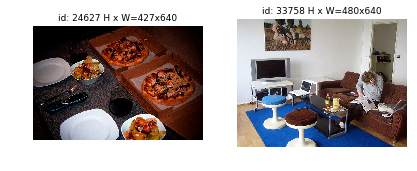

In [6]:
from mrcnn.prep_notebook import get_training_batch, get_inference_batch


# IMAGE_LIST = [18388, 64305] # , 1507]
# IMAGE_LIST = [107639, 112710, 39775]
# IMAGE_LIST = [24627, 33758, 6749]
IMAGE_LIST = [24627, 33758] # , 6749]
image_batch = get_image_batch(dataset_test,IMAGE_LIST, display=True)
# test_batch_x = get_training_batch(dataset_test, mrcnn_model.config, IMAGE_LIST)
# inference_batch, image_batch = get_inference_batch(dataset_test, mrcnn_model, IMAGE_LIST, display = True)

In [7]:
print(len(image_batch))
for i in image_batch:
    print(i.shape)
for i in inference_batch :    
    print(i.shape)

2
(427, 640, 3)
(480, 640, 3)


NameError: name 'inference_batch' is not defined

### Other display functions

#### Display top masks for sample images

In [ ]:
# Load and display random samples
image_ids = np.random.choice(dataset_test.image_ids, 7)
for image_id in image_ids:
    image = dataset_test.load_image(image_id)
    mask, class_ids = dataset_test.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_test.class_names)

####  Dispaly a random image from dataset_test

In [ ]:
# Load random image and mask. ### 27711 persons and boats
image_id = np.random.choice(dataset_test.image_ids)
_ = batch_input = demo_image(dataset_test, mrcnn_model.config, image_id, masks = False)

#### Get an image and place into train_batch_x

In [ ]:
IMAGE_LIST= [30531]
batch_input = get_input_batch(dataset_test, mrcnn_model.config, 30531, masks = False)

## FCN detection using `fcn.detect()` - run `image_batch` Image List through model pipeline

In [8]:
fcn_results = fcn_model.detect(mrcnn_model, image_batch)

call mrcnn predict()
    Wrapper for Detection Layer : call()  <class 'list'> 4
     rpn_proposals_roi  : (2, 1000, 4) <class 'numpy.ndarray'>
     mrcnn_class.shape  : (2, 1000, 81) <class 'numpy.ndarray'>
     mrcnn_bboxes.shape : (2, 1000, 81, 4) <class 'numpy.ndarray'>
     image_meta         : (2, 89) <class 'numpy.ndarray'>


 Detections are:
[[ 326.      224.      536.      431.       46.        0.9775]
 [ 236.      422.      412.      690.       54.        0.9775]
 [ 170.       58.      853.     1010.       61.        0.9324]
 [ 708.      516.      853.      824.       46.        0.8151]
 [ 405.      652.      632.      968.       54.        0.7908]
 [ 352.        0.      546.      222.       46.        0.7747]
 [ 422.      256.      453.      302.       52.        0.7513]
 [ 530.       51.      668.      277.       44.        0.7466]
 [ 662.      167.      853.      470.       46.        0.7392]
 [ 536.      450.      721.      600.       42.        0.727 ]
 [ 269.      212.  

In [9]:
np.set_printoptions(linewidth=180,precision=4,threshold=10000, suppress = True)
print(len(fcn_results))
r = fcn_results[0]
print(r.keys())
# for i in r.keys():
#     print(i , r[i].shape)
print('  image          : ', r["image"].shape )
print('  image_meta     : ', r["image_meta"].shape, r["image_meta"][:11] )
print('  rois           : ', r['rois'].shape)
print(r['rois'])
print('  class ids      : ', r['class_ids'].shape, r['class_ids'])
print('  scores         : ', r['mrcnn_scores'].shape)
print('  pr_heatmap     : ', r['pr_hm'].shape)
print('  fcn_hm         : ', r['fcn_hm'].shape)
print('  fcn_sm         : ', r['fcn_sm'].shape)
print('  pr_scores      : ', r['pr_scores'].shape)
print('  pr_scores  : ')
print(r['pr_scores'])
print('  fcn_scores:',r['fcn_scores'].shape)
print('  fcn_scores  : ')
print(r['fcn_scores'])
# 
# print('  pr_scores_by_class:',r['pr_scores_by_class'].shape)
# print(r['pr_scores_by_class'][ r['class_ids'],:10])
# print('  fcn_scores_by_class:',r['fcn_scores_by_class'].shape)
# print(r['fcn_scores_by_class'][ r['class_ids'],:10])



2
dict_keys(['fcn_sm', 'rois', 'fcn_scores', 'image', 'pr_hm', 'fcn_scores_by_class', 'mrcnn_scores', 'image_meta', 'class_ids', 'pr_scores', 'pr_scores_by_class', 'fcn_hm'])
  image          :  (427, 640, 3)
  image_meta     :  (89,) [   0  427  640    3  170    0  853 1024    0    0    0]
  rois           :  (18, 4)
[[ 97 140 228 269]
 [ 41 263 151 431]
 [  0  36 426 631]
 [336 322 426 515]
 [146 407 288 605]
 [113   0 235 138]
 [157 160 176 188]
 [225  31 311 173]
 [307 104 426 293]
 [228 281 344 375]
 [ 61 132 144 202]
 [ 58 133 144 203]
 [218  25 293 171]
 [194  23 327 188]
 [303  92 426 300]
 [244  63 321 210]
 [148 406 305 604]
 [235 274 355 380]]
  class ids      :  (18,) [46 54 61 46 54 46 52 44 46 42 41 42 43 45 72 66 49 46]
  scores         :  (18,)
  pr_heatmap     :  (256, 256, 81)
  fcn_hm         :  (256, 256, 81)
  fcn_sm         :  (256, 256, 81)
  pr_scores      :  (18, 11)
  pr_scores  : 
[[   97.       140.       228.       269.        46.         0.9775   100.     

## Run `inference_batch` through models using `run_inference_pipeline()`

### Run `inference_batch` through mrcnn modeI 

In [ ]:
from mrcnn.callbacks import get_layer_output_1
mrcnn_output = get_layer_output_1(mrcnn_model.keras_model, inference_batch, [1,2,3], 1, verbose = True)

### Run Image List through pipeline `run_inference_pipeline()`

In [ ]:
# mrcnn_model.layer_info()
# fcn_model.layer_info()
# # IMAGE_LIST = [18388, 64305, 1507]
# # IMAGE_LIST = [24627, 33758] # , 6749]
# IMAGE_LIST = [18388, 64305] #1507]
# outputs = run_inference_pipeline(mrcnn_model, fcn_model, dataset_test, IMAGE_LIST, verbose = True)

### Run Image List through pipeline `run_training_pipeline()`

In [ ]:
mrcnn_model.layer_info()
fcn_model.layer_info()
# IMAGE_LIST = [18388, 64305, 1507]
IMAGE_LIST = [24627, 33758] # , 6749]
outputs = run_training_pipeline(mrcnn_model, fcn_model, dataset_test, IMAGE_LIST)

###  Print some model information 

In [ ]:
float_formatter = lambda x: "%10.4f" % x
np_format = {}
np_format['float']=float_formatter
np.set_printoptions(linewidth=150, precision=3, floatmode='fixed', threshold =10000, formatter = np_format)   

In [ ]:
# results = mrcnn_model.detect([image], verbose=1)
# r = results[0]
print('  Length of outputs:', len(outputs))
print(outputs.keys())
for i in outputs.keys():
    print(i)
    shp = [str(j.shape) for j in outputs[i]]
    print(shp)
        
# print('  Length of r:', len(r))
# print('  rois       : ', r['rois'])
# print('  class ids  : ', r['class_ids'])
# print('  class names: ', dataset_test.class_names)
# print('  scores     : ', r['scores'])

In [ ]:
bbox_ixs = np.arange(20,26)
print(bbox_ixs)
# print(r['scores'][bbox_ixs])
visualize.display_instances(image, r['rois'][bbox_ixs], r['class_ids'][bbox_ixs], 
                            dataset_test.class_names, r['scores'][bbox_ixs], ax=visualize.get_ax(size=12))

#### Push Data thru model using get_layer_output()

In [ ]:
# model_output = get_layer_output_2(model.keras_model, train_batch_x, 1)
from mrcnn.callbacks import get_layer_output_1
model_output = get_layer_output_1(mrcnn_model.keras_model, test_batch_x, [0,1,2,3,4,5], 1, verbose = True)

### Display output from model

#### Display input_data

In [ ]:
# del input_image, input_image_meta, input_gt_class_ids, input_gt_bboxes #, input_gt_bboxes_norm
input_image      =  test_batch_x[0]
input_image_meta =  test_batch_x[1]

print(input_image.shape)
h, w = input_image.shape[1], input_image.shape[2]      #  tf.shape(input_image)[1], tf.shape(input_image)[2]
print('height/width', h,w)
print(' Input image shape is    :', input_image.shape)
print(' input_image_meta        :', input_image_meta)

# input_gt_bboxes_norm = input_gt_bboxes / [h,w,h,w]
# input_normlzd_gt_bboxes = tf.identity(input_gt_bboxes / [h,w,h,w])

#### Display Output Data

In [ ]:
print(len(model_output))
# del mrcnn_detection, rpn_roi_proposals, mrcnn_class, mrcnn_bbox
mrcnn_detection           = model_output[0]          # layer:  0   shape: (1, 100, 6)
rpn_roi_proposals         = model_output[1]          # layer:  1   shape: (1, 1000, 4)
mrcnn_class               = model_output[2]          # layer:  2   shape: (1, 1000, 81)
mrcnn_bbox                = model_output[3]          # layer:  3   shape: (1, 1000, 81, 4)
# pred_heatmap_norm         = model_output[4]          # layer:  4   shape: (1, 256, 256, 81)
# pred_heatmap_scores       = model_output[5]          # layer:  5   shape: (1, 81, 100, 11)
# print(type(model_output[4]))
# print(type(output_rois))
for i in model_output:
    print( i.shape)

#### mrcnn_class

In [ ]:
print(mrcnn_bbox[0,:2].shape) 
print('mrcnn_class shape:', mrcnn_class.shape)
print('mrcnn_bbox shape :', mrcnn_bbox.shape)
pred_scores  = np.max(mrcnn_class,axis = -1)
pred_classes = np.argmax(mrcnn_class,axis = -1)
# pred_classes_2 = np.take(out_mrcnn_bbox, pred_classes, axis = 2)  
print(pred_classes.shape)
print(pred_classes[0])

# print(mrcnn_bbox[0,0])

# pred_bboxes  = mrcnn_bbox[:, pred_classes]
# print('pred_scores shape:', pred_scores.shape)
# print('pred_classes shape:', pred_classes.shape)
# print('pred_bboxes shape:', pred_scores.shape)
# print(mrcnn_bbox.shape)
# print(pred_bboxes.shape)
# print(pred_bboxes[0,:10])


# print(' pred_scores \n',pred_scores)
# print(' pred_classes \n', pred_classes)
# for cls,score in zip(pred_classes,pred_scores):
#     print(' {:3d} {:.<20s} {:4f} '.format(cls, class_names[cls],score))


#### `rpn_roi_proposals`

In [ ]:
# print(input_gt_boxes.shape, input_image.shape)
print('output_rois',rpn_roi_proposals.shape, 'deltas ', mrcnn_bbox.shape, 'class_ids ', mrcnn_class.shape)

print(rpn_roi_proposals[0,:20])
print(rpn_roi_proposals[0,:20]*[h,w,h,w])
# print(input_gt_class_ids)
# print(input_normlzd_gt_bboxes)
# print(input_gt_bboxes_norm.shape)
# print(rpn_roi_proposals.shape)

## simulation of fcn model `Detect()` routine

In [ ]:
print(outputs.keys())

In [ ]:
# print(fcn_scores[0,:10])
# print(detections[0,:10])
IMAGE_LIST = [18388, 64305] # , 1507]
# IMAGE_LIST = [107639, 112710, 39775]
image_batch = get_image_batch(dataset_test, IMAGE_LIST, display = True)

####  Prepare images to pass to model prediction pipeline

In [ ]:
from mrcnn.utils import log
images = outputs['image_batch']
verbose = True
self = mrcnn_model

##-------------------------------------------------------------------------------------        
#     def detect(self, images, verbose=0):
'''
Runs the detection pipeline.

images:         List of images, potentially of different sizes.

Returns a list of dicts, one dict per image. The dict contains:

rois:           [N, (y1, x1, y2, x2)] detection bounding boxes
class_ids:      [N] int class IDs
scores:         [N] float probability scores for the class IDs
masks:          [H, W, N] instance binary masks
'''

# assert self.mode   == "inference", "Create model in inference mode."
assert len(images) == self.config.BATCH_SIZE, "len(images) must be equal to BATCH_SIZE"

if verbose:
    log("Processing {} images".format(len(images)))
    for image in images:
        log("image", image)

# Mold inputs to format expected by the neural network
molded_images, image_metas, windows = self.mold_inputs(images)
if verbose:
    log("molded_images", molded_images)
    log("image_metas"  , image_metas)

####  Run predcitions pipeline

In [ ]:
## Run object detection pipeline

print('call mrcnn predict()')
mrcnn_detections, rpn_roi_proposals, mrcnn_class, mrcnn_bbox, pr_hm, pr_hm_scores =  \
          mrcnn_model.keras_model.predict([molded_images, image_metas], verbose=0)

print('    return from  mrcnn_predict()')
print('    Length of detections          : ', len(mrcnn_detections), mrcnn_detections.shape)
# print('    detections \n', detections)
print('    Length of rpn_roi_proposals   : ', len(rpn_roi_proposals), rpn_roi_proposals.shape)
# print('    Length of rpn_class         : ', len(rpn_class  ))
# print('    Length of rpn_bbox          : ', len(rpn_bbox   ))
print('    Length of mrcnn_class         : ', len(mrcnn_class), mrcnn_class.shape)
print('    Length of mrcnn_bbox          : ', len(mrcnn_bbox ), mrcnn_bbox.shape)
print('    Length of pr_hm               : ', len(pr_hm), pr_hm.shape)
print('    Length of pr_hm_scores        : ', len(pr_hm_scores), pr_hm_scores.shape)


print('call fcn predict()')
fcn_hm, fcn_sm, fcn_hm_scores = fcn_model.keras_model.predict([pr_hm, pr_hm_scores], verbose = 1)

## Run object detection pipeline 
print('    return from  predict()')
print('    Length of fcn_heatmaps : ', len(fcn_hm), fcn_hm.shape)
print('    Length of fcn_softmax  : ', len(fcn_sm), fcn_sm.shape)
print('    Length of fcn_hm_scores: ', len(fcn_hm_scores), fcn_hm_scores.shape)
 
# Process detections

#### After `predict()` functions  -  call `unmold_detections()` - Prepare output of model prediction for display

In [ ]:
np.set_printoptions(linewidth=180,precision=3,threshold=10000, suppress = True)
fcn_results = []

for i, image in enumerate(images):
    print(' Unmold image ', i, 'image_shape: ', image.shape,  '  windows[]:', windows[i])
    mrcnn_rois, mrcnn_class_ids, mrcnn_scores = mrcnn_model.unmold_detections(mrcnn_detections[i], image.shape, windows[i])    
    print(pr_hm_scores[i].shape)
    print(fcn_hm_scores[i].shape)
    print('mrcnn_class_ids: ', mrcnn_class_ids)
    ## pr_hm_scores is by image/class/bounding box
    ## fcn_hm_scores is by image/class/bounding box
    
    ## reshape pr_hm_scores from per_class to per_image tensor
    ## Convert pr_scores_by_image bboxes from NN coordinates to image coordinates
    #     pr_scores_by_image = utils.byclass_to_byimage_np(pr_hm_scores[i], 6)
    #     print(' pr_scores_by_class shape',pr_scores_by_image.shape)
    #     pr_boxes_adj = utils.boxes_to_image_domain(pr_scores_by_image[:,:4],image_metas[i])
    #     pr_scores_by_image = np.hstack((pr_boxes_adj, pr_scores_by_image[:,4:]))
    #     print(' pr_boxes_adj')
    #     print(pr_boxes_adj)
    #     print(' pr_scores_by_image')
    #     print(pr_scores_by_image)

    ## pr_hm_scores is by class  
    ## Convert pr_hm_scores bboxes from NN coordinates to image coordinates
    pr_boxes_adj = utils.boxes_to_image_domain(pr_hm_scores[i,:,:,:4],image_metas[i])
    pr_scores_by_class= np.dstack((pr_boxes_adj, pr_hm_scores[i,:,:,4:]))
    print(' fcn_scores_by_class shape', fcn_scores_by_class.shape)
    pr_scores_by_image = utils.byclass_to_byimage_np(pr_scores_by_class, 6)

    #     print(' pr_boxes_adj_2')
#     print(pr_boxes_adj_2[mrcnn_class_ids, :10])
#     print(' pr_scores_by_class')
#     print(pr_scores_by_class[mrcnn_class_ids, :10])

    ## fcn_hm_scores is by class  
    ## Convert pr_hm_scores bboxes from NN coordinates to image coordinates
    fcn_boxes_adj = utils.boxes_to_image_domain(fcn_hm_scores[i,:,:,:4],image_metas[i])
    fcn_scores_by_class= np.dstack((pr_boxes_adj, fcn_hm_scores[i,:,:,4:]))
    print(' fcn_scores_by_class shape', fcn_scores_by_class.shape)
    fcn_scores_by_image = utils.byclass_to_byimage_np(fcn_scores_by_class, 6)
#     print(' pr_boxes_adj')
#     print(pr_boxes_adj[mrcnn_class_ids, :10])
#     print(' fcn_scores_by_class')
#     print(fcn_scores_by_class[mrcnn_class_ids, :10])  

#     fcn_scores_adj,fcn_rois, fcn_class_ids, mrcnn_scores_norm, fcn_scores = fcn_unmold_detections(fcn_model, fcn_hm_scores[i], image.shape, windows[i]) 
#     print(fcn_scores_adj.shape, fcn_rois.shape, fcn_class_ids.shape, mrcnn_scores_norm.shape, fcn_scores.shape)
    
    fcn_results.append({
        "image"        : images[i],
        "image_meta"   : image_metas[i],
        "rois"         : mrcnn_rois,
        "class_ids"    : mrcnn_class_ids,
        "mrcnn_scores" : mrcnn_scores, 
        "pr_scores"    : pr_scores_by_image,
        "pr_scores_by_class"    : pr_scores_by_class,
        "fcn_scores"   : fcn_scores_by_image,
        "fcn_scores_by_class"   : fcn_scores_by_class,

        "pr_hm"        : pr_hm[i],
        "fcn_hm"       : fcn_hm[i],
        "fcn_sm"       : fcn_sm[i]
    })
    
    # return results     

####  Display results from `detect()`

In [ ]:
np.set_printoptions(linewidth=180,precision=4,threshold=10000, suppress = True)
print(len(fcn_results))
r = fcn_results[1]
print(r.keys())
# for i in r.keys():
#     print(i , r[i].shape)
print('  image          : ', r["image"].shape )
print('  image_meta     : ', r["image_meta"].shape, r["image_meta"][:11] )
print('  rois           : ', r['rois'].shape)
print(r['rois'])
print('  class ids      : ', r['class_ids'].shape, r['class_ids'])
print('  scores         : ', r['mrcnn_scores'].shape)
print('  pr_heatmap     : ', r['pr_hm'].shape)
print('  fcn_hm         : ', r['fcn_hm'].shape)
print('  fcn_sm         : ', r['fcn_sm'].shape)
print('  pr_scores      : ', r['pr_scores'].shape)
print('  pr_scores  : ')
print(r['pr_scores'])
print('  fcn_scores:',r['fcn_scores'].shape)
print('  fcn_scores  : ')
print(r['fcn_scores'])
# 
# print('  pr_scores_by_class:',r['pr_scores_by_class'].shape)
# print(r['pr_scores_by_class'][ r['class_ids'],:10])
# print('  fcn_scores_by_class:',r['fcn_scores_by_class'].shape)
# print(r['fcn_scores_by_class'][ r['class_ids'],:10])



## Display results from `detect()`

 display_instances() : Image shape:  (427, 640, 3)


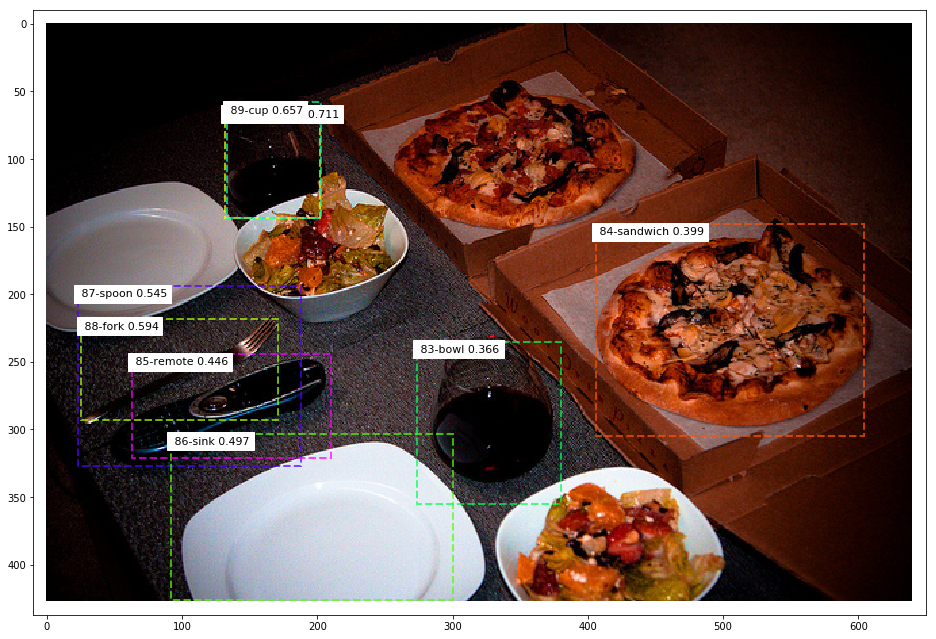

In [38]:
img_idx = 0
r = fcn_results[img_idx]
visualize.display_instances_from_prscores(image_batch[img_idx], r['fcn_scores'], coco_class_names, score_range=(0.0, 0.72))

In [36]:
# from mrcnn.visualize import display_heatmaps_mrcnn
# # np.unique(r['class_ids'])
# display_heatmaps_mrcnn([molded_images, image_metas], [r['pr_hm'], r['pr_scores_by_class']], 0, class_ids = r['class_ids'], 
#                             class_names = coco_class_names, config = mrcnn_model.config)


### Compare mrcnn predcited and FCN generated heatmaps from inference process

 heatmap shape:  (256, 256, 81)
 Bounding boxes shape:  (81, 100, 13)
Image shape : (427, 640, 3)  class_ids: [41 42 43 44 45 46 49 52 54 61 66 72]


D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


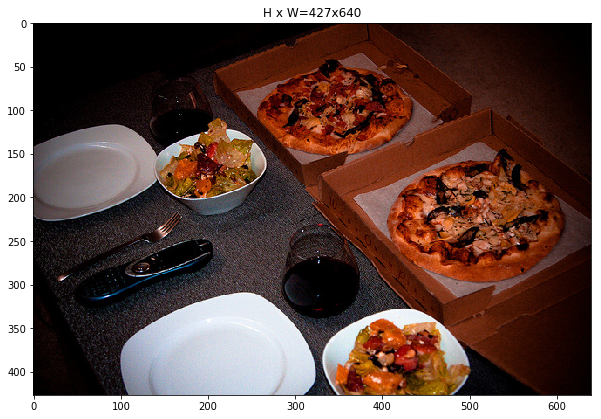

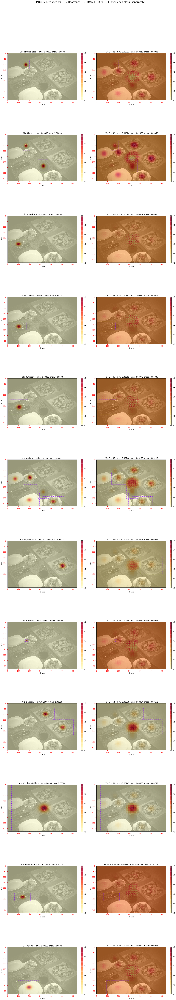

In [15]:
class_ids = np.arange(20)
visualize.inference_heatmaps_compare(fcn_results, img_idx, class_ids = None, class_names=coco_class_names, hm = 'hm', config = mrcnn_model.config,scaling = 'each')

 Image Id:  0  Display classes: [41 42 43 44 45 46 49 52 54 61 66 72]
 rows   4  columns : 3 boxes.shape :  (81, 100, 13)
 min_z_all shape: ()  min_z_all: -0.080357105  max_z_all: () max_z_all: 0.45007673
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == none 


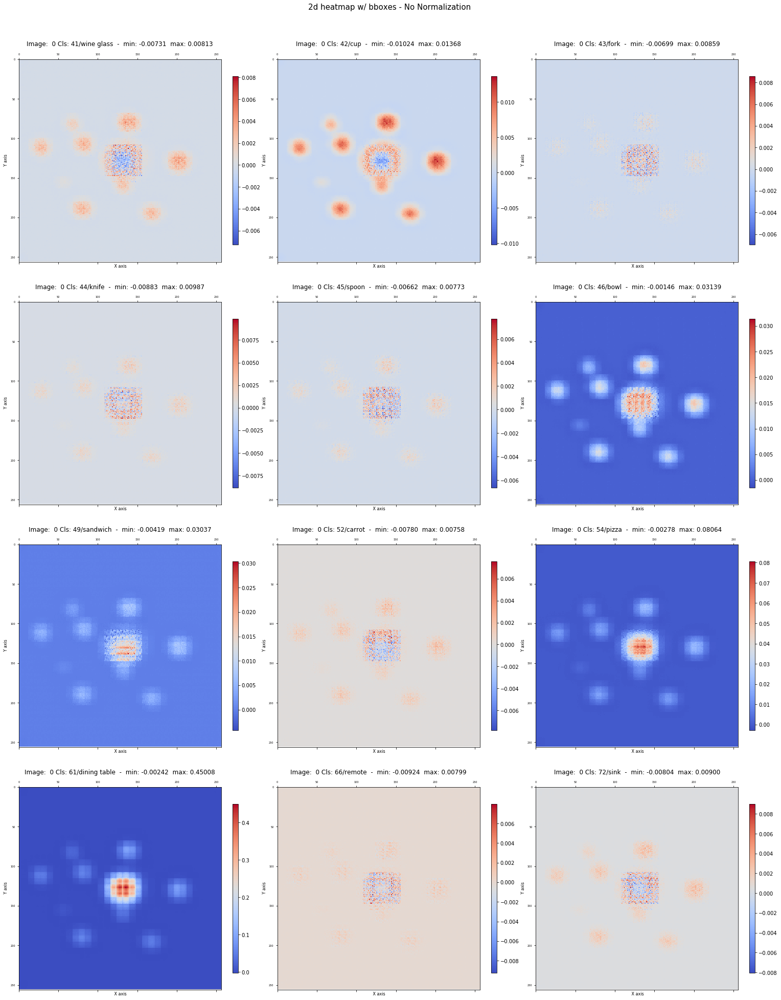

In [34]:
img_id = 0
r = fcn_results[img_id]
pr_class_ids = np.unique(r['class_ids'])
fig = visualize.plot_2d_heatmap(r['fcn_hm'], r['fcn_scores_by_class'], img_id, pr_class_ids, columns = 3, num_bboxes = 0,
                          class_names = coco_class_names, scale = 4, scaling = 'none')

####  3D comparative display `pred_heatmap` / `fcn_heatmap` 

3
Image : 0  Predicted    ClassIds: [0, 41, 42, 43, 44, 45, 46, 49, 52, 54, 61, 66, 72]
Display classes: [0, 41, 42, 43, 44, 45, 46, 49, 52, 54, 61, 66, 72]
 image height/width  256 256
shape pos  (256, 256, 2) shape Z1:  (256, 256, 81) shape Z2: (256, 256, 81)
 min_z1_all shape: ()  min_z1_all: 0.0  max_z1_all: () max_z1_all: 1.0
 min_z2_all shape: ()  min_z2_all: -0.080357105  max_z2_all: () max_z2_all: 0.45007673
ttl:  HM1 Img:  0 Cls:  0/BG  -  min: 0.00000  max: 0.00000
ttl:  HM2 Img:  0 Cls:  0/BG  -  min: -0.08036  max: 0.07182
ttl:  HM1 Img:  0 Cls: 41/wine glass  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls: 41/wine glass  -  min: -0.00731  max: 0.00813
ttl:  HM1 Img:  0 Cls: 42/cup  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls: 42/cup  -  min: -0.01024  max: 0.01368
ttl:  HM1 Img:  0 Cls: 43/fork  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls: 43/fork  -  min: -0.00699  max: 0.00859
ttl:  HM1 Img:  0 Cls: 44/knife  -  min: 0.00000  max: 1.00000
ttl:  HM2 I

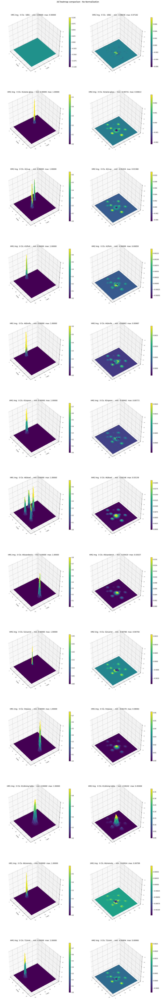

In [33]:
img_id = 0
r = fcn_results[img_id]
print(r['pr_scores_by_class'].ndim)
# print('Image id: ',image_id, ' Coco ID: ', dataset_train.image_info[image_id]['id'])
pr_class_ids = np.unique(r['pr_scores_by_class'][:,:,4]).astype(int).tolist()
print('Image : {}  Predicted    ClassIds: {}'.format(img_id, pr_class_ids))

visualize.plot_3d_heatmap_compare(r['pr_hm'], r['fcn_hm'], 0, class_ids = pr_class_ids, 
                            class_names = coco_class_names, size=(8,8), zlim = 'all' , scaling = 'none')    